### Visualizing what convnets learn and,
### Mack medel to classification Cats and Dogs image

It is often said that deep learning models are "black boxes", learning representations that are difficult to extract and present in a human-readable form.

While this is partially true for certain types of deep learning models, it is definitely not true for convnets. The representations learned by convnets are highly amenable to visualization, in large part because they are representations of visual concepts. Since 2013, a wide array of techniques have been developed for visualizing and interpreting these representations. We won't survey all of them, but we will cover three of the most accessible and useful ones:

Visualizing intermediate convnet outputs ("intermediate activations"). This is useful to understand how successive convnet layers transform their input, and to get a first idea of the meaning of individual convnet filters.
Visualizing convnets filters. This is useful to understand precisely what visual pattern or concept each filter in a convnet is receptive to.
Visualizing heatmaps of class activation in an image. This is useful to understand which part of an image where identified as belonging to a given class, and thus allows to localize objects in images.
For the first method -- activation visualization -- we will use the small convnet that we trained from scratch on the cat vs. dog classification problem two sections ago. 
For the next two methods, we will use the InceptionV3 model

### Key convolution property


It's critical to understand what does a feature map represent with respect to the input image.

Baiscally a 4x4 feature map tensor, can be resized and layed over the input, in that case it's clear it segments the image into 4 areas. Those areas are essential in almost all CV tasks. In SS, those are superpixels. In Object detection, they help search for the boxes. In classification, they also search for the class to look for in different areas efficiently.



### Visualizing intermediate activations

Visualizing intermediate activations consists in displaying the feature maps that are output by various convolution and pooling layers in a network, given a certain input (the output of a layer is often called its "activation", the output of the activation function). This gives a view into how an input is decomposed unto the different filters learned by the network.

These feature maps we want to visualize have 3 dimensions: width, height, and depth (channels). Each channel encodes relatively independent features, so the proper way to visualize these feature maps is by independently plotting the contents of every channel, as a 2D image.

#### import libraries

In [1]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import joblib
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model, Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input, decode_predictions
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K
import cv2
import warnings



warnings.filterwarnings("ignore")
K.clear_session()
tf.compat.v1.disable_eager_execution()

#### pass train and test direction

In [2]:
train_path = r"F:\computer vision files\cats vs dogs\training_set"
test_path = r"F:\computer vision files\cats vs dogs\test_set"

#### ckeck and evaluate a single image before model has been fit, 
####  delete image that make error in fit operation
#### and make 'DataFrame'

In [3]:
import PIL
from pathlib import Path
from PIL import UnidentifiedImageError
import os

path = [r"F:\computer vision files\cats vs dogs\test_set\cats",
        r"F:\computer vision files\cats vs dogs\test_set\dogs",
        r"F:\computer vision files\cats vs dogs\training_set\cats",
        r"F:\computer vision files\cats vs dogs\training_set\dogs"]


full_path = []
for item in path:
    path = Path(item).rglob("*.jpg")
    
    for img_p in path:
        try:
            img = PIL.Image.open(img_p)
            full_path.append(img_p)
            
        except:
            print(img_p)
            os.remove(img_p)

In [4]:
df = pd.DataFrame(data=full_path, columns=["path"])
df

,path
0,F:\computer vision files\cats vs dogs\test_set...
1,F:\computer vision files\cats vs dogs\test_set...
2,F:\computer vision files\cats vs dogs\test_set...
3,F:\computer vision files\cats vs dogs\test_set...
4,F:\computer vision files\cats vs dogs\test_set...
...,...
34977,F:\computer vision files\cats vs dogs\training...
34978,F:\computer vision files\cats vs dogs\training...
34979,F:\computer vision files\cats vs dogs\training...
34980,F:\computer vision files\cats vs dogs\training...


#### fix DataFrame

In [5]:
def fix_df(row):
    name = str(row).split("\\")[-1]
    label = str(row).split("\\")[-2]
    data_split = str(row).split("\\")[-3]
    
    return pd.Series([name, label, data_split])

In [6]:
df[["name", "label", "data_split"]] = df["path"].apply(fix_df)
df

,path,name,label,data_split
0,F:\computer vision files\cats vs dogs\test_set...,cat.4001.jpg,cats,test_set
1,F:\computer vision files\cats vs dogs\test_set...,cat.4002.jpg,cats,test_set
2,F:\computer vision files\cats vs dogs\test_set...,cat.4003.jpg,cats,test_set
3,F:\computer vision files\cats vs dogs\test_set...,cat.4004.jpg,cats,test_set
4,F:\computer vision files\cats vs dogs\test_set...,cat.4005.jpg,cats,test_set
...,...,...,...,...
34977,F:\computer vision files\cats vs dogs\training...,dog.995.jpg,dogs,training_set
34978,F:\computer vision files\cats vs dogs\training...,dog.996.jpg,dogs,training_set
34979,F:\computer vision files\cats vs dogs\training...,dog.997.jpg,dogs,training_set
34980,F:\computer vision files\cats vs dogs\training...,dog.998.jpg,dogs,training_set


In [7]:
for i in df[["label", "data_split"]]:
    print("-"*100)
    print(f"unique of {i} column is :")
    
    for item in df[i].unique():
        print(f"---- {item}")

----------------------------------------------------------------------------------------------------
unique of label column is :
---- cats
---- dogs
----------------------------------------------------------------------------------------------------
unique of data_split column is :
---- test_set
---- training_set


In [8]:
def get_class(label):
    if label == "dogs":
        return 1
    return 0

In [9]:
df["class"] = df["label"].apply(get_class)
df

,path,name,label,data_split,class
0,F:\computer vision files\cats vs dogs\test_set...,cat.4001.jpg,cats,test_set,0
1,F:\computer vision files\cats vs dogs\test_set...,cat.4002.jpg,cats,test_set,0
2,F:\computer vision files\cats vs dogs\test_set...,cat.4003.jpg,cats,test_set,0
3,F:\computer vision files\cats vs dogs\test_set...,cat.4004.jpg,cats,test_set,0
4,F:\computer vision files\cats vs dogs\test_set...,cat.4005.jpg,cats,test_set,0
...,...,...,...,...,...
34977,F:\computer vision files\cats vs dogs\training...,dog.995.jpg,dogs,training_set,1
34978,F:\computer vision files\cats vs dogs\training...,dog.996.jpg,dogs,training_set,1
34979,F:\computer vision files\cats vs dogs\training...,dog.997.jpg,dogs,training_set,1
34980,F:\computer vision files\cats vs dogs\training...,dog.998.jpg,dogs,training_set,1


#### Save DataFrame

In [10]:
joblib.dump(df, r"F:\computer vision files\cats vs dogs\cats_dogs_df.h5")

['F:\\computer vision files\\cats vs dogs\\cats_dogs_df.h5']

In [11]:
train_df = df[df["data_split"] == "training_set"]
train_df

,path,name,label,data_split,class
1985,F:\computer vision files\cats vs dogs\training...,0.jpg,cats,training_set,0
1986,F:\computer vision files\cats vs dogs\training...,1.jpg,cats,training_set,0
1987,F:\computer vision files\cats vs dogs\training...,10.jpg,cats,training_set,0
1988,F:\computer vision files\cats vs dogs\training...,100.jpg,cats,training_set,0
1989,F:\computer vision files\cats vs dogs\training...,1000.jpg,cats,training_set,0
...,...,...,...,...,...
34977,F:\computer vision files\cats vs dogs\training...,dog.995.jpg,dogs,training_set,1
34978,F:\computer vision files\cats vs dogs\training...,dog.996.jpg,dogs,training_set,1
34979,F:\computer vision files\cats vs dogs\training...,dog.997.jpg,dogs,training_set,1
34980,F:\computer vision files\cats vs dogs\training...,dog.998.jpg,dogs,training_set,1


In [12]:
df["label"].value_counts()

dogs    17498
cats    17484
Name: label, dtype: int64

#### Mack analysiss in Data
#### and visualization using 'plotly'

In [13]:
px.histogram(data_frame=train_df, x="label", color="label", width=600, height=600)

In [14]:
class_names = ['Cats', 'Dogs'] 

px.pie(names=class_names,values=df["label"].value_counts().values)

In [15]:
class_names = ['training_set', 'test_set'] 

px.pie(names=class_names, values=df["data_split"].value_counts().values)

#### ImageDataGenerator is used for getting the input of the original data and further, 
#### it makes the transformation of this data on a random basis and gives the output resultant containing 
#### only the data that is newly transformed.
#### and mack Data augmentation 

In [16]:
image_width, image_height = 150, 150

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=30,
      shear_range=0.3,
      zoom_range=0.3,
      width_shift_range=0.4,
      height_shift_range=0.4,
      horizontal_flip=True,
      fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale = 1./255.)

In [17]:
train_generator = train_datagen.flow_from_directory(
                    train_path,
                    batch_size=8,
                    class_mode='binary',
                    shuffle=True,
                    target_size=(image_width, image_height)
)     

test_generator =  test_datagen.flow_from_directory(
                    test_path,
                    batch_size=8,
                    class_mode='binary',
                    shuffle=True,
                    target_size=(image_width, image_height)
)

Found 32997 images belonging to 2 classes.
Found 1985 images belonging to 2 classes.


#### Know steps per epoch for train and validation data

In [18]:
train_steps = train_generator.n // train_generator.batch_size
test_steps = test_generator.n // test_generator.batch_size
print(train_steps)
print(test_steps)

4124
248


#### Inception v3 is an image recognition model that has been shown to attain greater than 78.1% accuracy 
#### on the ImageNet dataset. The model is the culmination of 
#### many ideas developed by multiple researchers over the years

In [83]:
incep = InceptionV3(weightkis='imagenet', include_top=False, input_shape=(150, 150, 3))

#### trainable to False moves all the layer's weights from trainable to non-trainable. 
#### This is called "freezing" the layer: the state of a frozen layer
#### won't be updated during training (either when training with fit() or 
#### when training with any custom loop that relies on 
#### trainable_weights to apply gradient updates)

In [20]:
for layer in (incep.layers):
    layer.trainable = False

#### Transfer learning
##### To save time and resources from having to train multiple machine learning models from scratch to complete similar tasks.

In [21]:
incep.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                       

#### Add Ann layers to: 
#### due to their universal approximation capabilities and 
#### flexible structure that allow to capture complex nonlinear behaviors.

In [22]:
model = Sequential()
model.add(incep)
model.add(Flatten())
model.add(BatchNormalization())
model.add(Dense(1024, activation="relu"))
model.add(Dense(512, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

In [23]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 3, 3, 2048)        21802784  
                                                                 
 flatten (Flatten)           (None, 18432)             0         
                                                                 
 batch_normalization_94 (Bat  (None, 18432)            73728     
 chNormalization)                                                
                                                                 
 dense (Dense)               (None, 1024)              18875392  
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 1)                 513       
                                                        

In [24]:
model.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])

#### use callback function to :
#### save model and avoid over fitting and save time in early stop.

In [25]:
ckpt = ModelCheckpoint(r"C:\Users\ammar\OneDrive\Desktop\Graduations\Apple\apple_model.h5", 
                       monitor='accuracy', verbose=1, save_best_only=True, mode='max')

redlr = ReduceLROnPlateau(patience=5, min_lr=1e-5, verbose=1)
es = EarlyStopping(patience=5, verbose=1)

##### for better accuracy Increase the number of epochs 

In [23]:
history = model.fit(
        train_generator,
        steps_per_epoch=train_steps,
        epochs=100, verbose=1,
        validation_data=test_generator,
        validation_steps=test_steps,
        callbacks=[ckpt, redlr, es])

Epoch 1/100
2521/4124 [=================>............] - ETA: 9:37 - loss: 0.2998 - accuracy: 0.8698

E:\anaconda files\envs\test\lib\site-packages\PIL\TiffImagePlugin.py:845: UserWarning: Truncated File Read
  warnings.warn(str(msg))


4124/4124 [==============================] - ETA: 0s - loss: 0.2875 - accuracy: 0.8745
Epoch 1: saving model to F:\computer vision files\cats vs dogs\cats_dogs_model.h5
4124/4124 [==============================] - 1565s 379ms/step - loss: 0.2875 - accuracy: 0.8745 - val_loss: 0.0929 - val_accuracy: 0.9655 - lr: 1.0000e-05
Epoch 2/100
4124/4124 [==============================] - ETA: 0s - loss: 0.2465 - accuracy: 0.8905
Epoch 2: saving model to F:\computer vision files\cats vs dogs\cats_dogs_model.h5
4124/4124 [==============================] - 1570s 381ms/step - loss: 0.2465 - accuracy: 0.8905 - val_loss: 0.0868 - val_accuracy: 0.9660 - lr: 1.0000e-05
Epoch 3/100
4124/4124 [==============================] - ETA: 0s - loss: 0.2365 - accuracy: 0.8987
Epoch 3: saving model to F:\computer vision files\cats vs dogs\cats_dogs_model.h5
4124/4124 [==============================] - 1513s 367ms/step - loss: 0.2365 - accuracy: 0.8987 - val_loss: 0.0860 - val_accuracy: 0.9655 - lr: 1.0000e-05
Epoc

#### Class index

In [27]:
clss = train_generator.class_indices
clss

{'cats': 0, 'dogs': 1}

#### fit image to model :
#### make prediction of classification model.

In [54]:
path = r"F:\computer vision files\cats vs dogs\test_set\cats\cat.4004.jpg"

In [55]:
def predict(image_path):
    global img
    check = []
    
    img = image.load_img(image_path, target_size=(150, 150))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = img / 255.0
    for i in range(3):
        index = np.round(model.predict(img)[0][0])
        check.append(index)
    
    if sum(check) > 1:
        return "Dog"
    
    return"Cat"

In [56]:
predict(path)

'Cat'

#### for many images

In [57]:
def plot_predict_image(images_path):
    
    if type(images_path) == str:
        images_path = [images_path]
        
    for path in images_path:
        img = image.load_img(path, target_size=(150, 150))
        img = image.img_to_array(img)
        
        fig = px.imshow(img, title=f"Prediction is : {predict(path)}")
        fig.update_xaxes(showticklabels=False)
        fig.update_yaxes(showticklabels=False)
        
        fig.show()


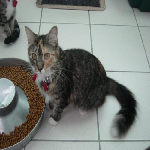


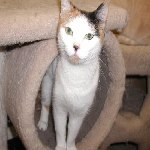


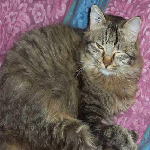


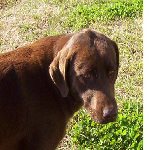


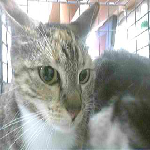


...


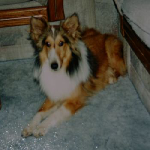


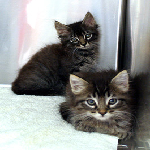


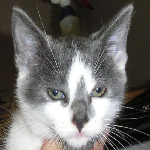


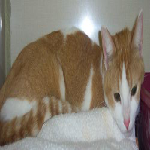


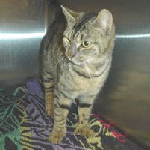

In [58]:
plot_predict_image(df["path"].sample(20))

#### Keras functional model to get the output of intermediate layer In order to extract the feature maps we want to look at, we will create a Keras model that takes batches of images as input, and outputs the activations of all convolution and pooling layers.

#### To do this, we will use the Keras class Model. A Model is instantiated using two arguments: an input tensor (or list of input tensors), and an output tensor (or list of output tensors).

#### The resulting class is a Keras model, just like the Sequential models that you are familiar with, mapping the specified inputs to the specified outputs. What sets the Model class apart is that it allows for models with ___multiple outputs__, unlike Sequential.



In [60]:
layer_outputs = [layer.output for layer in incep.layers[1:len(incep.layers)]]
# Creates a model that will return these outputs, given the model input:
activation_model = Model(inputs=incep.input, outputs=layer_outputs)

#### When fed an image input, this model returns the values of the layer activations in the original model. 

#### This is the first time you encounter a multi-output model: until now the models you have seen only had exactly one input and one output. 

#### In the general case, a model could have any number of inputs and outputs. 
#### This one has one input and 8 outputs, one output per layer activation.

In [63]:
activations = activation_model.predict(img)
activations

[array([[[[-0.10436347,  0.22127499,  0.15572307, ..., -0.2767212 ,
            0.23156781, -0.03855386],
          [-0.104864  ,  0.21916035,  0.1530607 , ..., -0.27473953,
            0.22980404, -0.0378376 ],
          [-0.10553376,  0.21722192,  0.14877962, ..., -0.2706382 ,
            0.23209156, -0.02477214],
          ...,
          [ 0.04201753,  0.19386987,  0.21136364, ..., -0.24687965,
            0.17778648, -0.05187697],
          [ 0.04251418,  0.19439816,  0.20923485, ..., -0.2492611 ,
            0.1779292 , -0.04471077],
          [ 0.03948391,  0.18790416,  0.20442931, ..., -0.2386037 ,
            0.17150919, -0.04481043]],
 
         [[-0.08471041,  0.22128232,  0.16452478, ..., -0.274341  ,
            0.24565576, -0.0424451 ],
          [-0.08483482,  0.21928746,  0.16207536, ..., -0.2710898 ,
            0.24414101, -0.04198087],
          [-0.08664967,  0.22087301,  0.16683334, ..., -0.27426755,
            0.24229829, -0.03272339],
          ...,
          [ 0

In [64]:
len(activations)

310

#### For instance, this is the activation of the first convolution layer for our cat image input:


In [65]:
frist_layer = activations[3]
frist_layer.shape

(1, 72, 72, 32)

#### It's a 72x72 feature map with 32 channels. Let's try visualizing the 3rd channel:

In [66]:
px.imshow(frist_layer[0, :, :, 3], color_continuous_scale="viridis")

#### This channel appears to encode a diagonal edge detector. 
#### Let's try the 3th channel -- but note that your own channels may vary, 
#### since the specific filters learned by convolution layers are not deterministic

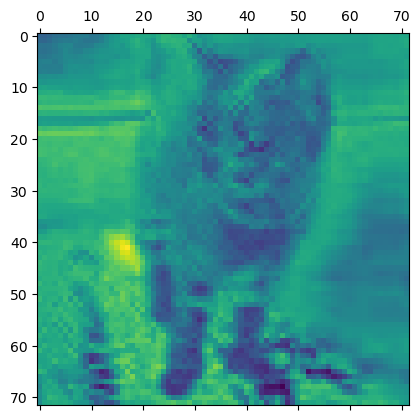

In [67]:
plt.matshow(frist_layer[0, :, :, 3], cmap="viridis")

In [70]:
px.imshow(frist_layer[0, :, :, 20], color_continuous_scale="viridis")

#### This one looks like a "bright green dot" detector, 
#### useful to encode cat eyes. At this point, 
#### let's go and plot a complete visualization of all the activations in the network.
#### We'll extract and plot every channel in each of our 8 activation maps, 
#### and we will stack the results in one big image tensor, 
#### with channels stacked side by side.

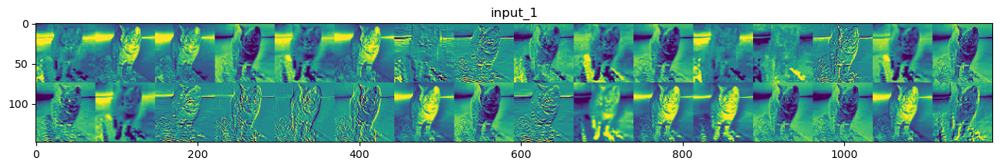

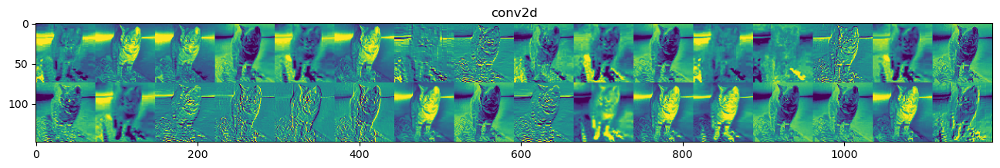

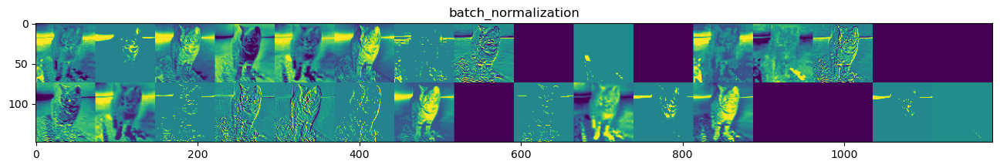

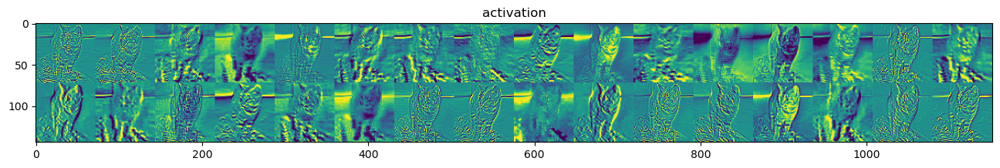

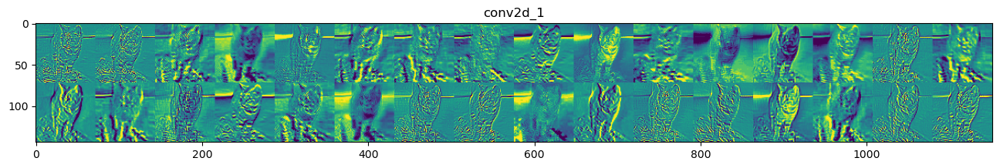

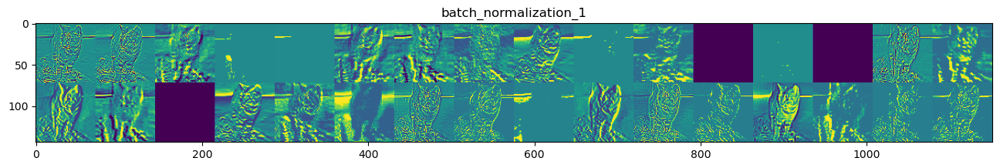

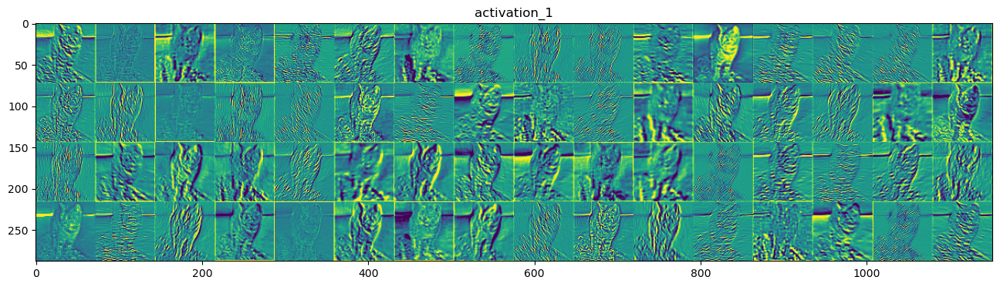

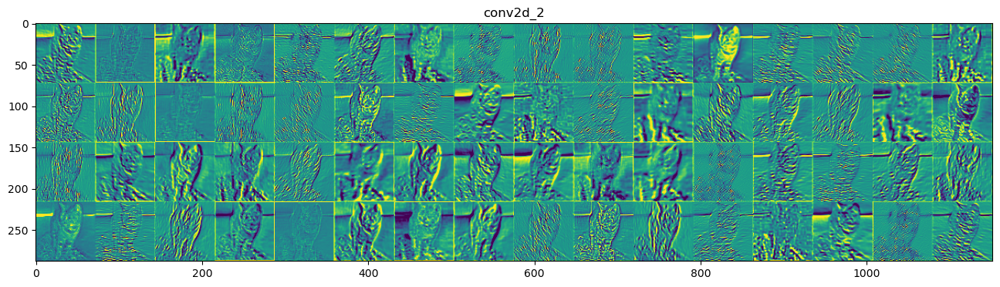

In [71]:
layer_names = []
for layer in activation_model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

### Visualizing heatmaps of class activation


#### We will introduce one more visualization technique, one that is useful for understanding which parts of a given image led a convnet to its final classification decision. This is helpful for "debugging" the decision process of a convnet, in particular in case of a classification mistake. It also allows you to locate specific objects in an image.

#### This general category of techniques is called "Class Activation Map" (CAM) visualization, and consists in producing heatmaps of "class activation" over input images. A "class activation" heatmap is a 2D grid of scores associated with an specific output class, computed for every location in any input image, indicating how important each location is with respect to the class considered. For instance, given a image fed into one of our "cat vs. dog" convnet, Class Activation Map visualization allows us to generate a heatmap for the class "cat", indicating how cat-like different parts of the image are, and likewise for the class "dog", indicating how dog-like differents parts of the image are

###  Grad-CAM
The specific implementation we will use is the one described in Grad-CAM: Why did you say that? Visual Explanations from Deep Networks via Gradient-based Localization.

It is very simple: it consists in taking the output feature map of a convolution layer given an input image, and weighing every channel in that feature map by the gradient of the class with respect to the channel.

Intuitively, one way to understand this trick is that we are weighting a spatial map of "how intensely the input image activates different channels" by "how important each channel is with regard to the class", resulting in a spatial map of "how intensely the input image activates the class".

In [72]:
incep_model = InceptionV3(weights='imagenet')

In [73]:
incep_model.summary()


Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_188 (Conv2D)            (None, 149, 149, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_189 (Batch  (None, 149, 149, 32  96         ['conv2d_188[0][0]']             
 Normalization)                 )                                                      

#### Let's consider the following image of Cat, 
#### possible a mother and its cub, 
#### strolling in the savanna (under a Creative Commons license):



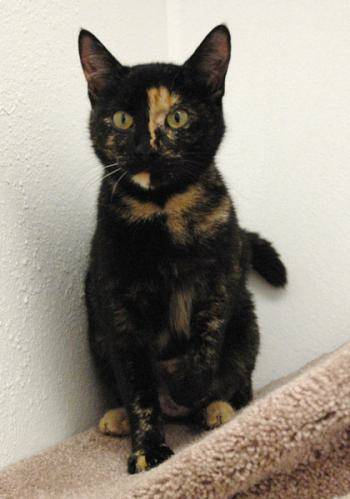

In [107]:
# The local path to our target image
img_path = r"F:\computer vision files\cats vs dogs\test_set\cats\cat.4644.jpg"

# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(299, 299, 3))

# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch"
# of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch
# (this does channel-wise color normalization)
x = preprocess_input(x)

#### You can now run the pretrained network on the image and decode its prediction vector back to a human-readable format:



In [114]:
preds = incep_model.predict(x)
print('the probability of Predicted is : \n', decode_predictions(preds, top=3)[0])

the probability of Predicted is : 
 [('n02124075', 'Egyptian_cat', 0.74609876), ('n02123045', 'tabby', 0.14916568), ('n02123159', 'tiger_cat', 0.009972947)]


#### To visualize which parts of our image were the most Cat"
-like, let's set up the Grad-CAM process:

In [109]:
np.argmax(preds[0])

285

The conv2d_259 output is batch_sizexx8x8x320 = 1x8x8x320

Now, we can merge the block5_conv3 outputs (batch_sizex8x8x320), by weighting and sum over the 320 dimension with the grads to get one heatmap 1x8x8.


In [110]:
# This is the "cat" entry in the prediction vector
cat = incep_model.output[:, 283]

# The is the output feature map of the `conv2d_259` layer,
# the last convolutional layer in InceptionV3
last_conv_layer = incep_model.get_layer('conv2d_259')

# This is the gradient of the "cat" class with regard to
# the output feature map of `conv2d_259`
grads = K.gradients(cat, last_conv_layer.output)[0]

# This is a vector of shape (320,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `conv2d_259`,
# given a sample image
iterate = K.function([incep_model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of cat
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the cat class
for i in range(320):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

In [111]:
heatmap.shape

(8, 8)

For visualization purpose, we will also normalize the heatmap between 0 and 1:


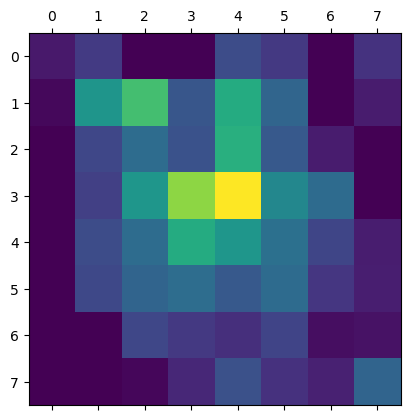

In [112]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

Finally, we will use OpenCV to generate an image that superimposes the original image with the heatmap we just obtained.

The resulting heatmap is 8x8, with each block has a receptive field over the input 224x224 image.

You can think of it as a drop of ink spilled over to cover bigger area.

So each block of the 8x8 corresponds to an area of size = 224/8x224/8 in the input image.

In [113]:
# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite(r'F:\computer vision files\cats vs dogs\cam.jpg', superimposed_img)

True

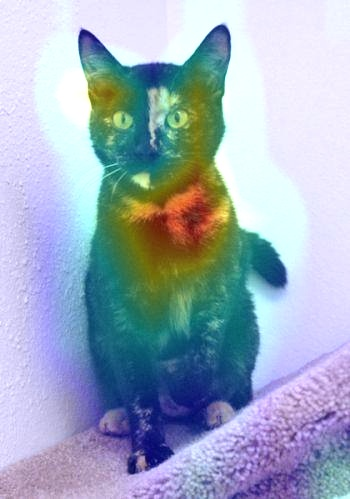

#### This visualisation technique answers two important questions:

#####  - Why did the network think this image contained an cat?
##### - Where is the cat located in the picture?


#### In particular, it is interesting to note that the ears of cat cub are strongly activated: this is probably how the network can tell the difference between cats type(Egyptian_cat, tiger_cat, )